In [1]:
!pip install -q kaggle --upgrade

In [2]:
from google.colab import files
files.upload()

Saving kaggle (2).json to kaggle (2).json


{'kaggle (2).json': b'{"username":"shubh134mishra","key":"00e0acdad07a79d3dbf451dd6f49017b"}'}

In [3]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json/

!kaggle datasets download siddharthkumarsah/ships-in-aerial-images
!unzip ships-in-aerial-images.zip -d ships-in-aerial-images

Streaming output truncated to the last 5000 lines.
  inflating: ships-in-aerial-images/ships-aerial-images/train/labels/x0593_png.rf.33fd03bd0d9896e31b73ac56c1e458c8.txt  
  inflating: ships-in-aerial-images/ships-aerial-images/train/labels/x0594_png.rf.1a86349573567a368a653b5b39fff4af.txt  
  inflating: ships-in-aerial-images/ships-aerial-images/train/labels/x0594_png.rf.ff6551627101ade7c4ecd6887fa45546.txt  
  inflating: ships-in-aerial-images/ships-aerial-images/train/labels/x0595_png.rf.bc03f4a3bc686c5d239d8552ce57b5f5.txt  
  inflating: ships-in-aerial-images/ships-aerial-images/train/labels/x0597_png.rf.918ed233995c3645a1ca8d14bf35a81c.txt  
  inflating: ships-in-aerial-images/ships-aerial-images/train/labels/x0598_png.rf.94d8be92f98bf3ff36cf9f51b1e17bc9.txt  
  inflating: ships-in-aerial-images/ships-aerial-images/train/labels/x0598_png.rf.a5b224c7880ba832c9d6d5aba3123e28.txt  
  inflating: ships-in-aerial-images/ships-aerial-images/train/labels/x0599_png.rf.d215436f7b245cf0a244

In [4]:
!mkdir /content/ships-in-aerial-images/ships-aerial-images/coco_train
!mkdir /content/ships-in-aerial-images/ships-aerial-images/coco_test
!mkdir /content/ships-in-aerial-images/ships-aerial-images/coco_valid

In [5]:
!pip install torch torchvision --extra-index-url https://download.pytorch.org/whl/cu117

Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu117
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86

In [6]:
!pip install pyyaml==6.0

import torch

TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]

print("Torch Version : {}, Cuda Version : {}".format(TORCH_VERSION, CUDA_VERSION))

!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 682.2/682.2 kB 30.1 MB/s eta 0:00:00
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0.2
    Uninstalling PyYAML-6.0.2:
      Successfully uninstalled PyYAML-6.0.2
Torch Version : 2.3, Cuda Version : cu121
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-dabmrdaa
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-dabmrdaa
  Resolved https://github.com/facebookresearch/detectron2.git to commit 5b72c27ae39f99db75d43f18fd1312e1ea934e60
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.2/78.2 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 11.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━

In [7]:
print(torch.cuda.is_available())

True


# **Libraries :-**

In [27]:
import os
import sys
import cv2
import json
import random
import numpy as np
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow


import detectron2
from detectron2.utils.logger import setup_logger
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, DatasetCatalog, build_detection_test_loader
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

**Function for Convertion to CoCo Format**

In [9]:
setup_logger()

def convert_2_COCO(input_dir, output_dir):

  categories = [{"id" : 1, "name" : "ship"}]
  ann_id = 1
  img_id = 0

  coco_dataset = {
      "info" : {},
      "licenses" : [],
      "categories" : categories,
      "images" : [],
      "annotations" : []
  }

  images_path = os.path.join(input_dir, "images")
  labels_path = os.path.join(input_dir, "labels")

  for image_file in os.listdir(images_path):
    # Getting Dimensions
    image_path = os.path.join(images_path, image_file)
    image = Image.open(image_path)
    width, height = image.size

    # Add the image to the COCO dataset
    image_dict = {
        "id": img_id,
        "width": width,
        "height": height,
        "file_name": image_path
    }
    coco_dataset["images"].append(image_dict)

    # Load the bounding box annotations for the image
    with open(os.path.join(labels_path, f'{image_file[:-4]}.txt'), 'r') as f:
      annotations = f.read().strip().split("\n")

    # Loop through the annotations and add them to the COCO dataset
    for ann in annotations:
      if len(ann.split()) != 5: continue
      _, x, y, w, h = map(float, ann.split())
      x_min, y_min = int((x - w / 2) * width), int((y - h / 2) * height)
      x_max, y_max = int((x + w / 2) * width), int((y + h / 2) * height)
      ann_dict = {
          "id": ann_id,
          "image_id": img_id,
          "category_id": 1,
          "bbox": [x_min, y_min, x_max - x_min, y_max - y_min],
          "area": (x_max - x_min) * (y_max - y_min),
          "iscrowd": 0
      }
      coco_dataset["annotations"].append(ann_dict)
      ann_id += 1
    img_id += 1

  print("Conversion Complete!")
  print("Final Image Count : {}".format(len(coco_dataset["images"])))

  if not os.path.isdir(output_dir):
    !mkdir output_dir

  # Save the COCO dataset to a JSON file
  with open(os.path.join(output_dir, 'annotations.json'), 'w') as f:
      json.dump(coco_dataset, f)

In [10]:
train_input_dir = "/content/ships-in-aerial-images/ships-aerial-images/train"
train_output_dir = "/content/ships-in-aerial-images/ships-aerial-images/coco_train"

test_input_dir = "/content/ships-in-aerial-images/ships-aerial-images/test"
test_output_dir = "/content/ships-in-aerial-images/ships-aerial-images/coco_test"

valid_input_dir = "/content/ships-in-aerial-images/ships-aerial-images/valid"
valid_output_dir = "/content/ships-in-aerial-images/ships-aerial-images/coco_valid"

convert_2_COCO(train_input_dir, train_output_dir)
convert_2_COCO(test_input_dir, test_output_dir)
convert_2_COCO(valid_input_dir, valid_output_dir)

Conversion Complete!
Final Image Count : 9697
Conversion Complete!
Final Image Count : 1573
Conversion Complete!
Final Image Count : 2165


In [11]:
register_coco_instances("trainDataset_v3", {}, "/content/ships-in-aerial-images/ships-aerial-images/coco_train/annotations.json", "/content/ships-in-aerial-images/ships-aerial-images/train")
register_coco_instances("testDataset_v3", {}, "/content/ships-in-aerial-images/ships-aerial-images/coco_test/annotations.json", "/content/ships-in-aerial-images/ships-aerial-images/test")
register_coco_instances("validDataset_v3", {}, "/content/ships-in-aerial-images/ships-aerial-images/coco_valid/annotations.json", "/content/ships-in-aerial-images/ships-aerial-images/valid")

In [12]:
trainMetadata = MetadataCatalog.get("trainDataset_v3")
trainDicts = DatasetCatalog.get("trainDataset_v3")

print(trainDicts[:5])

[08/24 06:59:08 d2.data.datasets.coco]: Loaded 9697 images in COCO format from /content/ships-in-aerial-images/ships-aerial-images/coco_train/annotations.json
[{'file_name': '/content/ships-in-aerial-images/ships-aerial-images/train/images/d0100_png.rf.042c688d9a8d2d7af5be42e240491d8e.jpg', 'height': 416, 'width': 416, 'image_id': 0, 'annotations': [{'iscrowd': 0, 'bbox': [148, 151, 88, 70], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}, {'file_name': '/content/ships-in-aerial-images/ships-aerial-images/train/images/bck_583_jpg.rf.bad5fd3d88359b63d6f050613bda8a65.jpg', 'height': 416, 'width': 416, 'image_id': 1, 'annotations': []}, {'file_name': '/content/ships-in-aerial-images/ships-aerial-images/train/images/m0143_png.rf.241f545438b72f637723cc2655c5bdab.jpg', 'height': 416, 'width': 416, 'image_id': 2, 'annotations': [{'iscrowd': 0, 'bbox': [207, 293, 35, 29], 'category_id': 0, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [57, 195, 26, 45], 'category_id': 0, 

# **Configurations** :-

In [13]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("trainDataset_v3", )
cfg.DATASETS.TEST = ("testDataset_v3", )

cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_50_FPN_3x.yaml")

cfg.SOLVER.IMS_PER_BATCH = 8
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.WARMUP_ITERS = 600
cfg.SOLVER.MAX_ITER = 1200
cfg.SOLVER.GAMMA = 0.05

cfg.MODEL.RETINANET.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.RETINANET.NUM_CLASSES = 1
cfg.MODEL.MASK_ON = False

cfg.TEST_EVAL_PERIOD = 500

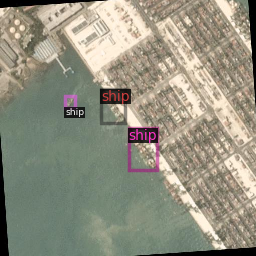

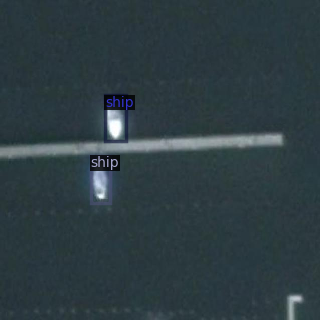

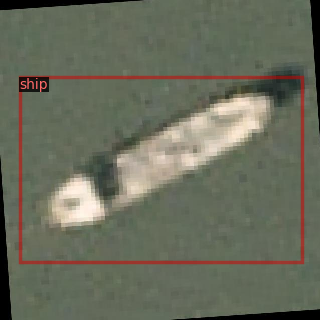

In [14]:
for d in random.sample(trainDicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=trainMetadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [15]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[08/24 06:59:10 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

model_final_5bd44e.pkl: 152MB [00:01, 101MB/s]                            
head.cls_score.{bias, weight}
  pixel_mean
  pixel_std


[08/24 06:59:13 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[08/24 06:59:49 d2.utils.events]:  eta: 0:24:08  iter: 19  total_loss: 2.246  loss_cls: 1.31  loss_box_reg: 0.8018    time: 1.4450  last_time: 1.2183  data_time: 0.1391  last_data_time: 0.0676   lr: 3.2635e-05  max_mem: 4163M
[08/24 07:00:20 d2.utils.events]:  eta: 0:24:15  iter: 39  total_loss: 1.344  loss_cls: 0.7881  loss_box_reg: 0.5211    time: 1.3441  last_time: 1.1269  data_time: 0.1125  last_data_time: 0.0892   lr: 6.5935e-05  max_mem: 4163M
[08/24 07:00:45 d2.utils.events]:  eta: 0:24:04  iter: 59  total_loss: 1.457  loss_cls: 0.8824  loss_box_reg: 0.5466    time: 1.3197  last_time: 1.3252  data_time: 0.1075  last_data_time: 0.1164   lr: 9.9235e-05  max_mem: 4163M
[08/24 07:01:11 d2.utils.events]:  eta: 0:23:55  iter: 79  total_loss: 1.472  loss_cls: 0.702  loss_box_reg: 0.7016    time: 1.3096  last_time: 1.2889  data_time: 0.1079  last_data_time: 0.0643   lr: 0.00013253  max_mem: 4165M
[08/24 07:01:38 d2.utils.events]:  eta: 0:23:44  iter: 99  total_loss: 0.8755  loss_cls: 0.

# **Visuals :-**

In [16]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [17]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5

predictor = DefaultPredictor(cfg)

[08/24 07:26:14 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


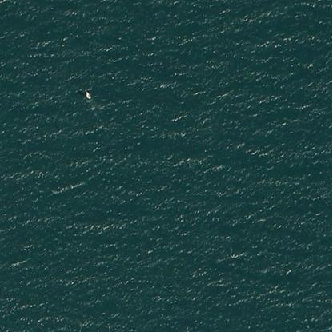

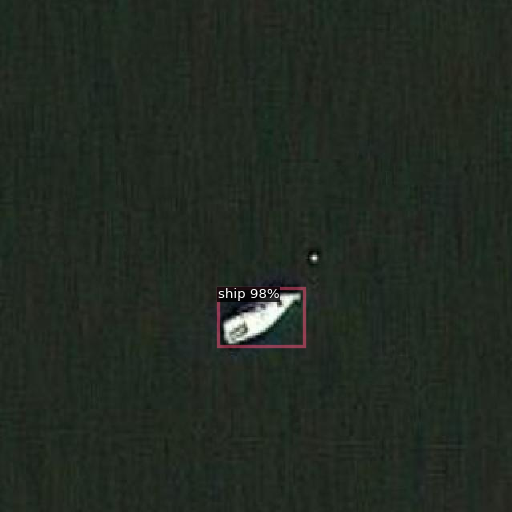

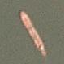

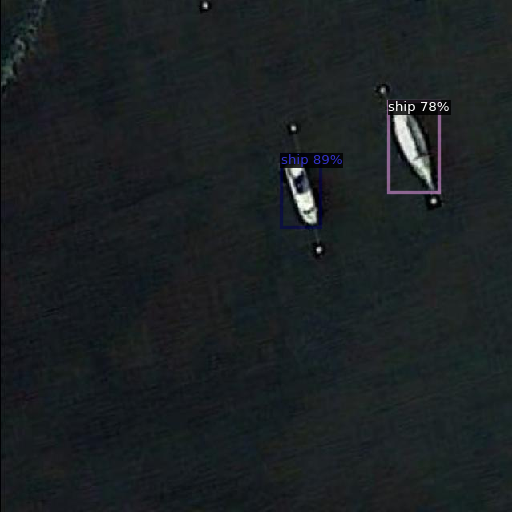

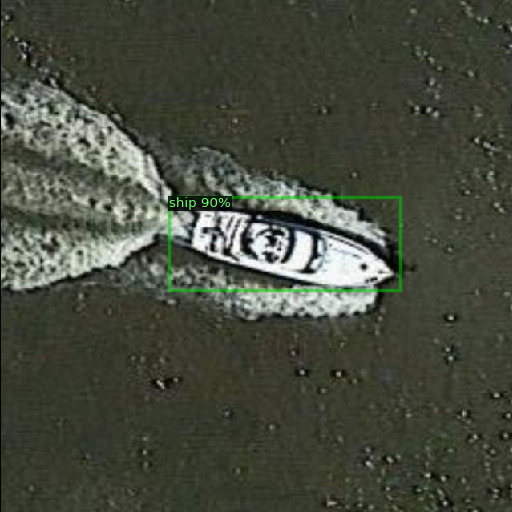

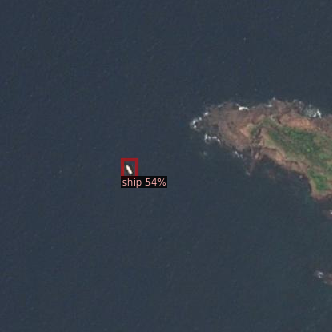

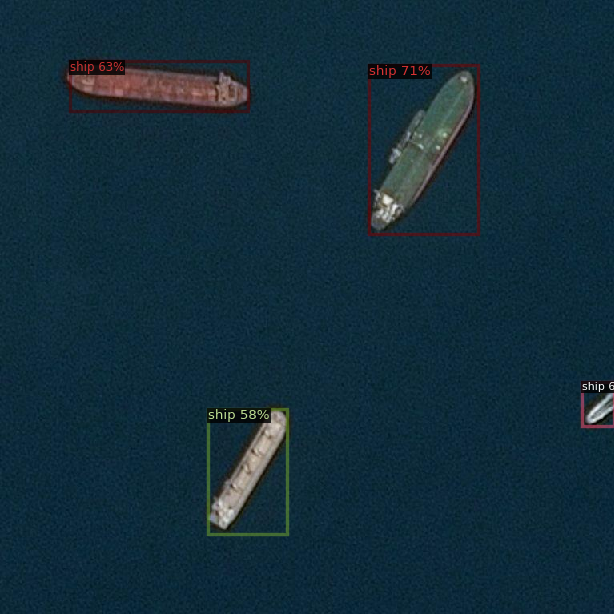

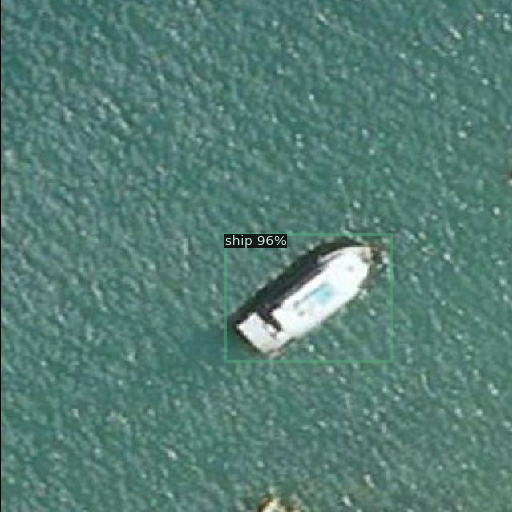

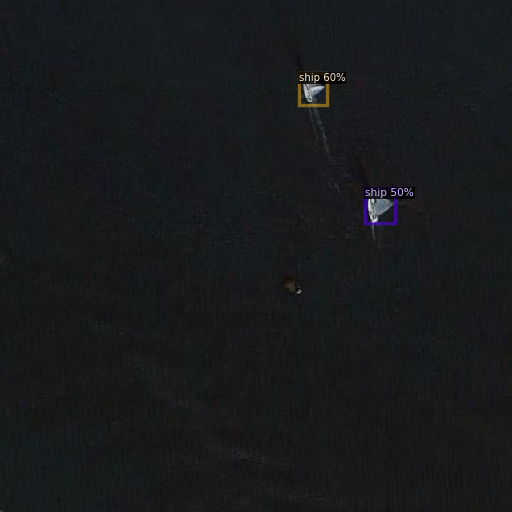

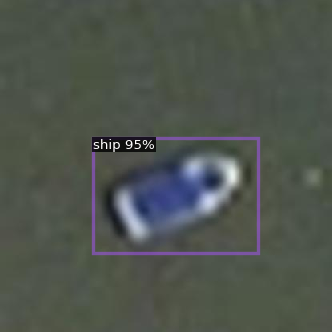

In [18]:
for d in random.sample(trainDicts, 10):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=trainMetadata,
                   scale=0.8,
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

In [19]:
evaluator = COCOEvaluator("validDataset_v3", tasks=("bbox", ), distributed=False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "validDataset_v3")
evaulation_results = inference_on_dataset(trainer.model, val_loader, evaluator)

[08/24 07:26:16 d2.data.datasets.coco]: Loaded 2165 images in COCO format from /content/ships-in-aerial-images/ships-aerial-images/coco_valid/annotations.json
[08/24 07:26:16 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    ship    | 3607         |
|            |              |
[08/24 07:26:16 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/24 07:26:16 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[08/24 07:26:16 d2.data.common]: Serializing 2165 elements to byte tensors and concatenating them all ...
[08/24 07:26:16 d2.data.common]: Serialized dataset takes 0.68 MiB
[08/24 07:26:16 d2.evaluation.evaluator]: Start inference on 2165 batches


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[08/24 07:26:18 d2.evaluation.evaluator]: Inference done 11/2165. Dataloading: 0.0079 s/iter. Inference: 0.0763 s/iter. Eval: 0.0004 s/iter. Total: 0.0847 s/iter. ETA=0:03:02
[08/24 07:26:23 d2.evaluation.evaluator]: Inference done 70/2165. Dataloading: 0.0092 s/iter. Inference: 0.0754 s/iter. Eval: 0.0005 s/iter. Total: 0.0851 s/iter. ETA=0:02:58
[08/24 07:26:28 d2.evaluation.evaluator]: Inference done 137/2165. Dataloading: 0.0056 s/iter. Inference: 0.0740 s/iter. Eval: 0.0004 s/iter. Total: 0.0801 s/iter. ETA=0:02:42
[08/24 07:26:33 d2.evaluation.evaluator]: Inference done 202/2165. Dataloading: 0.0049 s/iter. Inference: 0.0739 s/iter. Eval: 0.0004 s/iter. Total: 0.0793 s/iter. ETA=0:02:35
[08/24 07:26:38 d2.evaluation.evaluator]: Inference done 264/2165. Dataloading: 0.0049 s/iter. Inference: 0.0745 s/iter. Eval: 0.0004 s/iter. Total: 0.0799 s/iter. ETA=0:02:31
[08/24 07:26:43 d2.evaluation.evaluator]: Inference done 330/2165. Dataloading: 0.0043 s/iter. Inference: 0.0745 s/iter. E

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[08/24 07:29:06 d2.evaluation.evaluator]: Total inference time: 0:02:48.852746 (0.078173 s / iter per device, on 1 devices)
[08/24 07:29:06 d2.evaluation.evaluator]: Total inference pure compute time: 0:02:39 (0.073891 s / iter per device, on 1 devices)
[08/24 07:29:08 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[08/24 07:29:08 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[08/24 07:29:09 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.98s)
creating index...
index created!
[08/24 07:29:10 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[08/24 07:29:11 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.86 seconds.
[08/24 07:29:11 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[08/24 07:29:11 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.41 seconds.
 Average Precision  (AP)

In [20]:
val_image_path = os.path.join(valid_input_dir, "images")
val_label_path = os.path.join(valid_input_dir, "labels")

In [21]:
predictions = []

for val_path in os.listdir(val_image_path):
  img = cv2.imread(os.path.join(val_image_path, val_path))

  prediction = predictor(img)
  prediction["file_name"] = val_path
  predictions.append(prediction)

In [22]:
def calIOU(box1, box2):
  x1, y1, w1, h1 = box1
  x2, y2, w2, h2 = box2

  x_intersection = max(x1, x2)
  y_intersection = max(y1, y2)
  w_intersection = max(0, min(x1 + w1, x2 + w2) - x_intersection)
  h_intersection = max(0, min(y1 + h1, y2 + h2) - y_intersection)

  intersection_area = w_intersection * h_intersection

  area1 = w1 * h1
  area2 = w2 * h2

  union_area = area1 + area2 - intersection_area

  iou = intersection_area / union_area if union_area > 0 else 0

  return iou

In [30]:
pred_labels = []
true_labels = []
precisions = []
recalls = []
f1_scores = []
ious = []

tp = 0
fp = 0
fn = 0
tn = 0

for i, prediction in enumerate(predictions):
  if i == 0:
    continue
  pred_boxes = prediction["instances"].pred_boxes.tensor.cpu().numpy()
  scores = prediction["instances"].scores.cpu().numpy()

  img = cv2.imread(os.path.join(val_image_path, prediction["file_name"]))

  label_file = os.path.splitext(prediction["file_name"])[0] + ".txt"
  label_path = os.path.join(val_label_path, label_file)

  with open(label_path, "r") as f:
    labels = f.read().strip().split("\n")

  label_xywh = []

  for label in labels:
    if len(label.split()) != 5:
      continue
    class_id, x_center, y_center, width, height = map(float, label.split())
    x_min = int(abs(x_center - width/2) * img.shape[1])
    y_min = int(abs(y_center - height/2) * img.shape[0])
    x_max = int(abs(x_center + width/2) * img.shape[1])
    y_max = int(abs(y_center + height/2) * img.shape[0])
    label_xywh.append([x_min, y_min, x_max, y_max])

  if len(pred_boxes) > len(label_xywh):
    for i in range(len(pred_boxes) - len(label_xywh)):
      pred_labels.append(0)
      true_labels.append(1)
      fp += 1

  if len(pred_boxes) < len(label_xywh):
    pred_labels.append(1)
    true_labels.append(0)
    fn += 1

  print()
  print("For Prediction on File : {}".format(prediction["file_name"]))

  for i in range(min(len(pred_boxes), len(label_xywh))):
    iou = calIOU(pred_boxes[i], label_xywh[i])
    print("IOU : {}".format(iou))
    print("Pred Box : {}".format(pred_boxes[i]))
    print("Label Box : {}".format(label_xywh[i]))

    if iou == 0.0:
      continue

    if iou > 0.5:
      pred_labels.append(0)
      true_labels.append(0)
      tp += 1
    else:
      pred_labels.append(1)
      true_labels.append(0)
      fn += 1

    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    recall = 1 - recall
    f1_score = 2 * (precision * recall) / (precision + recall)

    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1_score)
    ious.append(iou)

print("TP : {}".format(tp))
print("FP : {}".format(fp))
print("FN : {}".format(fn))
print("TN : {}".format(tn))

#conf_matrix = confusion_matrix(true_labels, pred_labels)

#plt.figure(figsize=(8, 6))
#sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
#plt.xlabel('Predicted Label')
#plt.ylabel('True Label')
#plt.title('Confusion Matrix')
#plt.show()

Streaming output truncated to the last 5000 lines.

For Prediction on File : x0660_png.rf.973bc00d66e52436e99dfaa75f672cd3.jpg

For Prediction on File : ship_000177_png.rf.e8b053ca48021173e32de32b7cf5eebd.jpg
IOU : 0.9659629380930471
Pred Box : [202.82962  59.01167 463.3172  563.65106]
Label Box : [208, 51, 462, 571]

For Prediction on File : s0152_png.rf.4f7ac149a585e92f4172f2ea834a5209.jpg

For Prediction on File : d0694_png.rf.04db2c758d37ed83da6eeeb471349368.jpg
IOU : 0.9506175924475687
Pred Box : [149.73262  102.835556 281.78323  243.83673 ]
Label Box : [148, 105, 274, 242]

For Prediction on File : s0590_png.rf.e39e662f28a7b15f38eaf4c048a12a72.jpg

For Prediction on File : d1018_png.rf.9c987e6eca6a9ebe74ab5f70f9914ec3.jpg
IOU : 0.9238802574853062
Pred Box : [113.34402 141.05603 298.58453 308.60852]
Label Box : [109, 140, 288, 313]

For Prediction on File : GE_235_jpg.rf.f31f537ab9f17d5675f455234e7d50c2.jpg
IOU : 0.9352207305716045
Pred Box : [157.10872 166.5676  313.10715 413.064

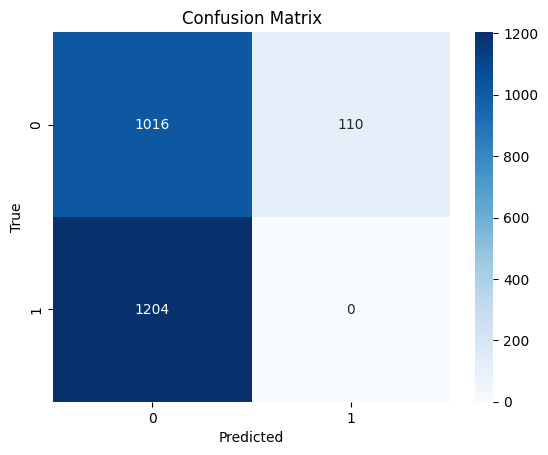

In [42]:
confMat = [[tp, fp], [fn, tn]]
sns.heatmap(confMat, annot=True, fmt='', cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

In [43]:
precision_recall_pairs = list(zip(precisions, recalls))

# Sort the precision_recall_pairs based on the recall values
sorted_precision_recall_pairs = sorted(precision_recall_pairs, key=lambda x: x[1])

# Unzip the sorted pairs back into separate lists
sorted_precisions, sorted_recalls = zip(*sorted_precision_recall_pairs)

print(sorted_precisions)
print(sorted_recalls)

(0.7777777777777778, 0.8, 0.8666666666666667, 0.8518518518518519, 0.875, 0.8859857482185273, 0.8857142857142857, 0.8854415274463007, 0.8851674641148325, 0.8848920863309353, 0.8867924528301887, 0.8865248226950354, 0.8571428571428571, 0.8846153846153846, 0.8843373493975903, 0.8862559241706162, 0.8840579710144928, 0.8490566037735849, 0.8873239436619719, 0.8837772397094431, 0.8870588235294118, 0.883495145631068, 0.8792710706150342, 0.8789954337899544, 0.8787185354691075, 0.8832116788321168, 0.8881118881118881, 0.8784403669724771, 0.8829268292682927, 0.8333333333333334, 0.8571428571428571, 0.8878504672897196, 0.8863109048723898, 0.882640586797066, 0.8875878220140515, 0.8825910931174089, 0.8823529411764706, 0.8872950819672131, 0.8808933002481389, 0.875, 0.8810483870967742, 0.8805309734513275, 0.8823529411764706, 0.8872950819672131, 0.8820638820638821, 0.8870636550308009, 0.8797327394209354, 0.8868312757201646, 0.8818380743982495, 0.8865979381443299, 0.8791946308724832, 0.8863636363636364, 0.

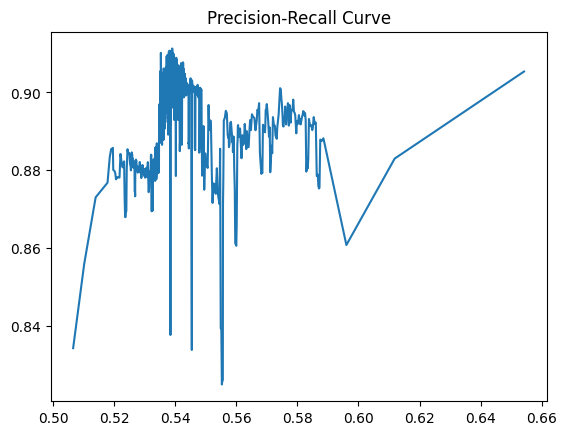

In [51]:
window_size = 5

smoothed_precisions = np.convolve(sorted_precisions, np.ones(window_size)/window_size, mode='valid')
smoothed_recalls = np.convolve(sorted_recalls, np.ones(window_size)/window_size, mode='valid')

plt.title("Precision-Recall Curve")
plt.plot(smoothed_recalls, smoothed_precisions)
plt.show()

In [45]:
f1_iou_pairs = list(zip(f1_scores, ious))

sorted_f1_iou_pairs = sorted(f1_iou_pairs, key=lambda x: x[1])

# Unzip the sorted pairs back into separate lists
sorted_f1_scores, sorted_ious = zip(*sorted_f1_iou_pairs)

Text(0.5, 1.0, 'F1-IOU Curve')

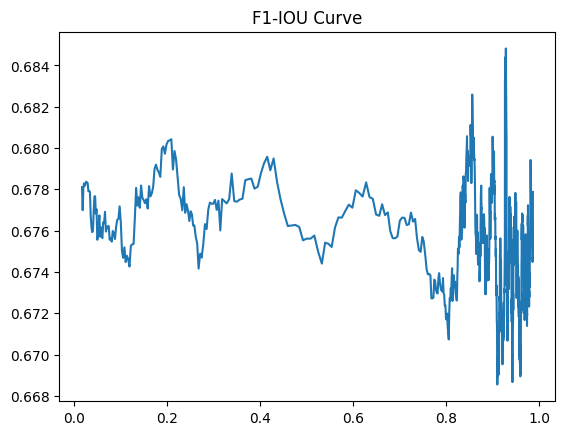

In [50]:
window_size = 30

smoothed_f1_scores = np.convolve(sorted_f1_scores, np.ones(window_size)/window_size, mode='valid')
smoothed_ious = np.convolve(sorted_ious, np.ones(window_size)/window_size, mode='valid')

plt.plot(smoothed_ious, smoothed_f1_scores)
plt.title("F1-IOU Curve")
plt.show()

In [53]:
max(f1_scores)

0.888888888888889